<h1>Pneumonia detection using pretraind resnet model</h1>

<h1>Objective :</h1>
<p>Pneumonia infection is a serious disease of the lungs with a range of possible causes. Bacteria, viruses or fungi can cause Pneumonia infection. Pneumonia is ranked as eighth leading for causing more no. of deaths in the US, It causes death in children younger than five years of age worldwide. To save precious lives of many people, humans and technology should interact.<p>

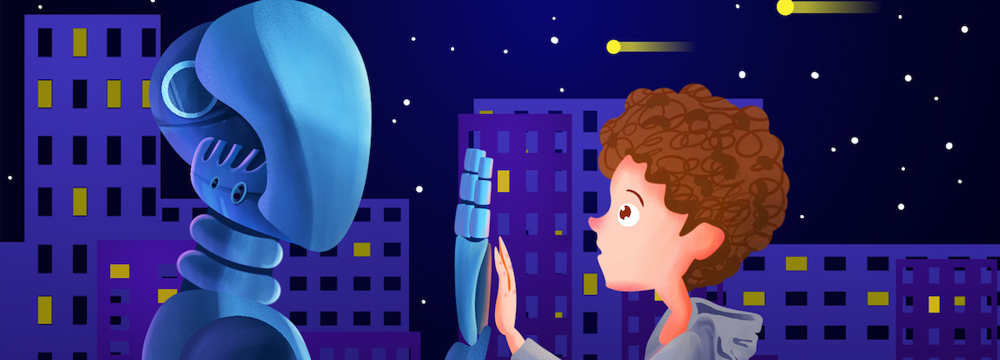


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.applications import ResNet50, EfficientNetB0
from PIL import ImageFile
import os
import shutil
import datetime
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image
import cv2
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import img_to_array


The dataset used here is chest xray dataset which is preprocessed.
You can find the **Dataset** [here.](https://drive.google.com/file/d/1SWqIJ0DXddE8C1GJFEvm-TU8ALQJMvjT/view?usp=drive_link)

**Creating the data augmentation and data generator.**

In [ ]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

train_path = "/content/drive/MyDrive/minip2B/data/data/train"
valid_path = "/content/drive/MyDrive/minip2B/data/data/val"

# Data Augmentation for Training
train_datagen = ImageDataGenerator(
    rotation_range=10,  # rotation
    width_shift_range=0.2,  # horizontal shift
    height_shift_range=0.2,  # vertical shift
    zoom_range=0.2,  # zoom
    horizontal_flip=True,  # horizontal flip
    rescale=1./255  # rescale pixel values
)

# Rescaling for Validation
valid_datagen = ImageDataGenerator(rescale=1./255)

# Data Generators
train_generator = train_datagen.flow_from_directory(
    directory=train_path,
    target_size=(224, 224),
    color_mode="rgb",
    batch_size=16,
    class_mode="categorical",
    shuffle=True,
    seed=42
)

valid_generator = valid_datagen.flow_from_directory(
    directory=valid_path,
    target_size=(224, 224),
    color_mode="rgb",
    batch_size=16,
    class_mode="categorical",
    shuffle=False,
    seed=42
)


Found 9170 images belonging to 2 classes.
Found 1720 images belonging to 2 classes.


**Plotting :** Images with Pneumonia from dataset.

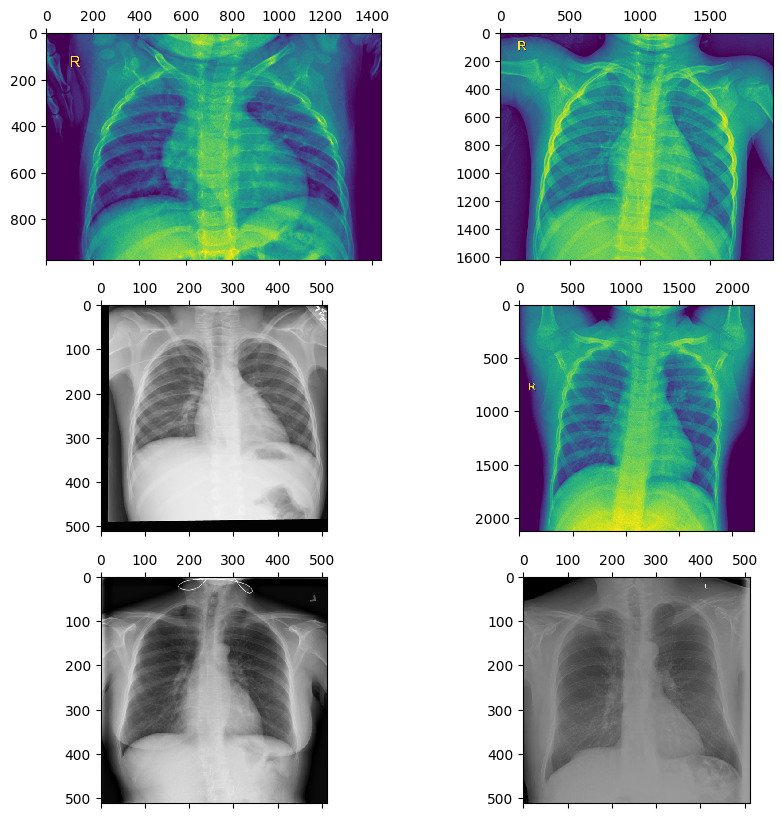

In [ ]:
#Pneumonia
plot_image = plt.figure(figsize=(10,10))

plot1 = plot_image.add_subplot(3,2,1)
plot2 = plot_image.add_subplot(3,2,2)
plot3 = plot_image.add_subplot(3,2,3)
plot4 = plot_image.add_subplot(3,2,4)
plot5 = plot_image.add_subplot(3,2,5)
plot6 = plot_image.add_subplot(3,2,6)
plot1.matshow(plt.imread(train_generator.filepaths[41]))
plot2.matshow(plt.imread(train_generator.filepaths[176]))
plot3.matshow(plt.imread(train_generator.filepaths[1553]))
plot4.matshow(plt.imread(train_generator.filepaths[354]))
plot5.matshow(plt.imread(train_generator.filepaths[2679]))
plot6.matshow(plt.imread(train_generator.filepaths[2710]))

In [ ]:
train_generator.class_indices

{'NORMAL': 0, 'PNEUMONIA': 1}

**Model outputs :**

0 : Normal condition

1 : Pneumonia condition

In [ ]:

# Model Setup
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze the weights of the earlier layers
for layer in base_model.layers[:]:
    layer.trainable = False

# Create a new model with the modified EfficientNetB0 base and additional dense layer
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),  # Dropout layer to prevent overfitting
    layers.Dense(2, activation='softmax')
])

model.summary()

# Learning Rate and Optimizer
learning_rate = 0.001
optimizer = optimizers.Adam(learning_rate=learning_rate)

# Compile Model
model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 7, 7, 1280)        4049571   
 )                                                               
                                                                 
 global_average_pooling2d_5  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_10 (Dense)            (None, 512)               655872    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_11 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 4706469 (17.95 MB)
Trainable params: 656

**Training the model for 30 epochs**

In [ ]:

# Set up logging and callbacks
log_dir = f"/content/drive/MyDrive/minip2B/data/logs/resnet50_{datetime.datetime.now().strftime('%Y%m%d-%H%M%S')}"
checkpoint_path = os.path.join(log_dir, "epoch-{epoch:02d}_val_loss-{val_loss:.3f}.h5")
filename = f"{log_dir}/train_logs.csv"


checkpoint = ModelCheckpoint(checkpoint_path, monitor="val_loss",save_weights_only=True, save_best_only=True, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=30, verbose=1)
tb_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
csv_logger = CSVLogger(filename, separator=",", append=False)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-20, verbose=1)

my_callbacks = [tb_callback, early_stop, checkpoint, csv_logger, reduce_lr]



In [ ]:
# Training Configuration
epochs = 30
verbose = 1

# Train Model
history = model.fit(
    train_generator,
    epochs=epochs,
    verbose=verbose,
    validation_data=valid_generator,
    callbacks=my_callbacks
)


Epoch 1/30
574/574 [==============================] - ETA: 0s - loss: 0.1705 - accuracy: 0.9314
Epoch 1: val_loss improved from inf to 0.11000, saving model to /content/drive/MyDrive/minip2B/data/logs/resnet50_20240713-103559/epoch-01_val_loss-0.110.h5
574/574 [==============================] - 269s 442ms/step - loss: 0.1705 - accuracy: 0.9314 - val_loss: 0.1100 - val_accuracy: 0.9605 - lr: 0.0010
Epoch 2/30
574/574 [==============================] - ETA: 0s - loss: 0.1146 - accuracy: 0.9601
Epoch 2: val_loss did not improve from 0.11000
574/574 [==============================] - 250s 436ms/step - loss: 0.1146 - accuracy: 0.9601 - val_loss: 0.1500 - val_accuracy: 0.9483 - lr: 0.0010
Epoch 3/30
574/574 [==============================] - ETA: 0s - loss: 0.1001 - accuracy: 0.9646
Epoch 3: val_loss did not improve from 0.11000
574/574 [==============================] - 249s 434ms/step - loss: 0.1001 - accuracy: 0.9646 - val_loss: 0.1521 - val_accuracy: 0.9407 - lr: 0.0010
Epoch 4/30
574/57

<h2>Accuracy : 98.5%</h2>

<h2>Val_accuracy : 97.4%</h2>

**<h3>Plotting Graphs</h3>**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/minip2B/data/logs/resnet50_20240713-103559"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

<h3>Loading the saved model so that we can load the model which is already saved so lot of time can be saved and it can also be used for deployment.</h3>

The accuracy of test data is : <h3>92.1%</h3>

**An image is used from drive for prediction**

In [ ]:
img= cv2.imread('/content/drive/MyDrive/minip2B/dataset/test/PNEUMONIA/person100_bacteria_475.jpeg')
tempimg = img
img = cv2.resize(img,(300,300))
img = img/255.0
img = img.reshape(1,300,300,3)
model.predict(img)

1/1 [==============================] - 0s 226ms/step


array([[0.]], dtype=float32)

The prediction shows value as **0** which is less than 0.5

so our model has to predict it as Normal which is done below.

1/1 [==============================] - 0s 52ms/step
Prediction: Normal


Text(0.5, 1.0, 'Prediction: Normal')

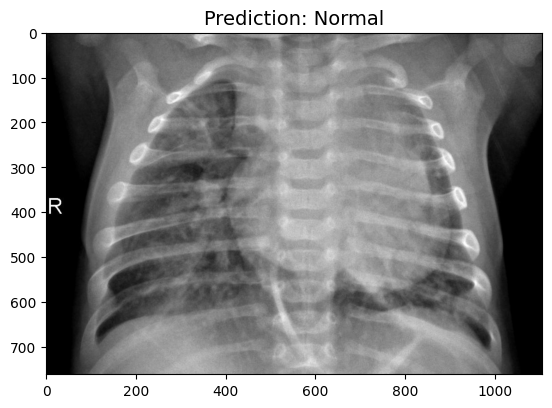

In [ ]:
prediction = model.predict(img) >= 0.5
if prediction>=0.5:
  prediction = "Pneumonia"
else:
  prediction = "Normal"
print("Prediction: "+prediction)
plt.imshow(tempimg)
plt.title("Prediction: "+prediction, fontsize=14)

In [ ]:
img= cv2.imread('/content/drive/MyDrive/chest_xray/test/PNEUMONIA/person104_bacteria_492.jpeg')
tempimg = img
img = cv2.resize(img,(300,300))
img = img/255.0
img = img.reshape(1,300,300,3)
model.predict(img)

array([[0.99988794]], dtype=float32)

Here another image is used and the model predicted it as **0.999** which is greater than 0.5.

so it have be Pneumonia image which is predicted below.

Prediction: Pneumonia


Text(0.5, 1.0, 'Prediction: Pneumonia')

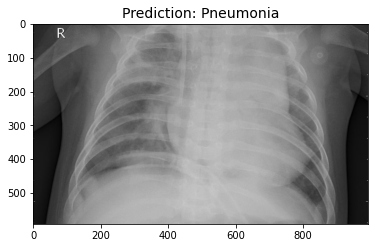

In [ ]:
prediction = model.predict(img) >= 0.5
if prediction>=0.5:
  prediction = "Pneumonia"
else:
  prediction = "Normal"
print("Prediction: "+prediction)
plt.imshow(tempimg)
plt.title("Prediction: "+prediction, fontsize=14)

<h2>Conclusion :</h2>

This model can be used in Healthcare industry in the radiological department.

It can be deployed to Xray machines.

This can help radiologist to predict the chest xray images easily and accurately.



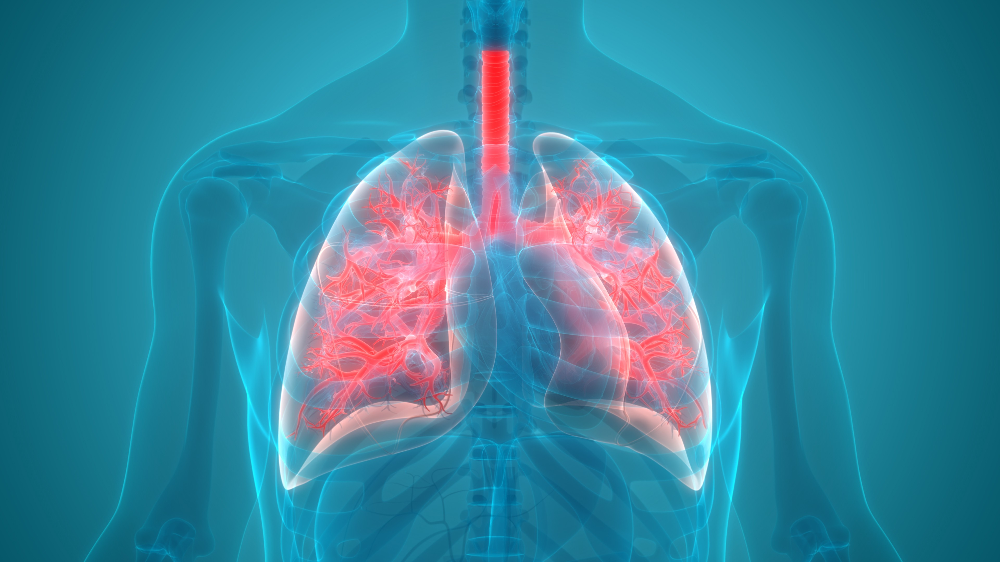